<h1><center style="color:#159364; font-family:cursive;">Marketing Campaign Performance Analysis📢</center></h1>

<h3  style="text-align:center;"><span class="label label-success">EDA,</span> <span class="label label-success">KPI Analysis,</span> <span class="label label-success">Data Visualization</span></h3>

***

# 📊 Introduction
This notebook presents an analysis of a **Marketing Campaign Performance dataset**, designed to offer **insights** into the efficiency and impact of various marketing initiatives. The dataset includes detailed information on:  
     
* Campaign types             
                      
* Target audiences          
              
* Duration and scheduling           
            
* Marketing channels used          
             
* Conversion rates and acquisition costs            
            
* Return on Investment (ROI)             
             
* Geographic and language segments              
             
* Clicks, impressions, and engagement scores             
            
* Customer segments and campaign timelines          
                   

Let's begin the analysis by loading the dataset and performing some initial exploration.     

## 🎯 Objective

**The primary goal of this analysis is to derive actionable insights into:**

* Campaign effectiveness

* Audience preferences and behavior

* Channel performance

* ROI optimization opportunities



https://www.kaggle.com/code/thabresh/eda-marketing-campaign-performance/input

## Load Libraries and Dataset

In [33]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
from scipy.stats import gaussian_kde
from plotly.subplots import make_subplots

In [49]:
data = pd.read_csv("../datasets/marketing_campaign_dataset.csv")

## **Overview of Dataset**

In [35]:
data.shape

(200000, 16)

In [36]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Campaign_ID       200000 non-null  int64  
 1   Company           200000 non-null  object 
 2   Campaign_Type     200000 non-null  object 
 3   Target_Audience   200000 non-null  object 
 4   Duration          200000 non-null  object 
 5   Channel_Used      200000 non-null  object 
 6   Conversion_Rate   200000 non-null  float64
 7   Acquisition_Cost  200000 non-null  object 
 8   ROI               200000 non-null  float64
 9   Location          200000 non-null  object 
 10  Language          200000 non-null  object 
 11  Clicks            200000 non-null  int64  
 12  Impressions       200000 non-null  int64  
 13  Engagement_Score  200000 non-null  int64  
 14  Customer_Segment  200000 non-null  object 
 15  Date              200000 non-null  object 
dtypes: float64(2), int64

In [37]:
data.head()

,Campaign_ID,Company,Campaign_Type,Target_Audience,Duration,Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Date
0,1,Innovate Industries,Email,Men 18-24,30 days,Google Ads,0.04,"$16,174.00",6.29,Chicago,Spanish,506,1922,6,Health & Wellness,2021-01-01
1,2,NexGen Systems,Email,Women 35-44,60 days,Google Ads,0.12,"$11,566.00",5.61,New York,German,116,7523,7,Fashionistas,2021-01-02
2,3,Alpha Innovations,Influencer,Men 25-34,30 days,YouTube,0.07,"$10,200.00",7.18,Los Angeles,French,584,7698,1,Outdoor Adventurers,2021-01-03
3,4,DataTech Solutions,Display,All Ages,60 days,YouTube,0.11,"$12,724.00",5.55,Miami,Mandarin,217,1820,7,Health & Wellness,2021-01-04
4,5,NexGen Systems,Email,Men 25-34,15 days,YouTube,0.05,"$16,452.00",6.50,Los Angeles,Mandarin,379,4201,3,Health & Wellness,2021-01-05


In [38]:
def columns_info(data):
    """
    Display a table showing the number of unique values for each column in the DataFrame.
    """
    unique_counts = {
        "Column": data.columns,
        "Unique Values": [data[col].nunique() for col in data.columns],
        'null values': [data[col].isna().sum() for col in data.columns]
    }
    
    result_df = pd.DataFrame(unique_counts)
    display(result_df)
columns_info(data)

,Column,Unique Values,null values
0,Campaign_ID,200000,0
1,Company,5,0
2,Campaign_Type,5,0
3,Target_Audience,5,0
4,Duration,4,0
5,Channel_Used,6,0
6,Conversion_Rate,15,0
7,Acquisition_Cost,15001,0
8,ROI,601,0
9,Location,5,0


In [39]:
data.describe()

,Campaign_ID,Conversion_Rate,ROI,Clicks,Impressions,Engagement_Score
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,100000.500000,0.080070,5.002438,549.772030,5507.301520,5.494710
std,57735.171256,0.040602,1.734488,260.019056,2596.864286,2.872581
min,1.000000,0.010000,2.000000,100.000000,1000.000000,1.000000
25%,50000.750000,0.050000,3.500000,325.000000,3266.000000,3.000000
50%,100000.500000,0.080000,5.010000,550.000000,5517.500000,5.000000
75%,150000.250000,0.120000,6.510000,775.000000,7753.000000,8.000000
max,200000.000000,0.150000,8.000000,1000.000000,10000.000000,10.000000


In [68]:
# Remove dollar sign and commas from 'Acquisition_Cost' column and convert it to float
data['Acquisition_Cost'] = data['Acquisition_Cost'].str.replace('$', '').str.replace(',', '').astype(float)

In [69]:
## this column has type object so we convert into int and change name 
data['Duration'] = data['Duration'].str.extract(r'(\d+)').astype(int)



KeyError: 'Duration'

In [70]:
data = data.rename(columns={'Duration': 'Duration(Days)'})

In [71]:
# Convert 'Date' feature to datetime format (YYYY-MM-DD)
data['Date'] = pd.to_datetime(data['Date'])

## unique value of each categorical feature

In [54]:
# Unique values of 'Company'
Company_types = data['Company'].unique()
print("Unique Company:", Company_types)

Unique Company: ['Innovate Industries' 'NexGen Systems' 'Alpha Innovations'
 'DataTech Solutions' 'TechCorp']


In [55]:
# Unique values of 'Campaign_Type'
Company_types = data['Campaign_Type'].unique()
print("Unique Campaign Types:", Company_types)

Unique Campaign Types: ['Email' 'Influencer' 'Display' 'Search' 'Social Media']


In [56]:
# Unique values of 'Channel_Used'
Channel_Used = data['Channel_Used'].unique()
print("Unique Channel_Used:", Channel_Used)

Unique Channel_Used: ['Google Ads' 'YouTube' 'Instagram' 'Website' 'Facebook' 'Email']


In [57]:
# Unique values of 'Target_Audience'
Company_types = data['Target_Audience'].unique()
print("Unique Target_Audience:", Company_types)

Unique Target_Audience: ['Men 18-24' 'Women 35-44' 'Men 25-34' 'All Ages' 'Women 25-34']


In [58]:
# Unique values of 'Duration'
Company_types = data['Duration(Days)'].unique()
print("Unique Duration:", Company_types)

Unique Duration: [30 60 15 45]


In [59]:
# Unique values of 'Location'
Locations = data['Location'].unique()
print("Unique Locations:", Locations)

Unique Locations: ['Chicago' 'New York' 'Los Angeles' 'Miami' 'Houston']


In [60]:
# Unique values of 'Language'
Languages = data['Language'].unique()
print("Unique Languages:", Languages)

Unique Languages: ['Spanish' 'German' 'French' 'Mandarin' 'English']


In [61]:
# Unique values of 'Customer_Segment'
Customer_Segments = data['Customer_Segment'].unique()
print("Unique Customer_Segment:", Customer_Segments)

Unique Customer_Segment: ['Health & Wellness' 'Fashionistas' 'Outdoor Adventurers' 'Foodies'
 'Tech Enthusiasts']


In [62]:
# Convert features to categorical type

data['Company'] = data['Company'].astype('category')

data['Campaign_Type'] = data['Campaign_Type'].astype('category')

data['Target_Audience'] = data['Target_Audience'].astype('category')

data['Channel_Used'] = data['Channel_Used'].astype('category')

data['Language'] = data['Language'].astype('category')

data['Customer_Segment'] = data['Customer_Segment'].astype('category')

In [63]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Campaign_ID       200000 non-null  int64         
 1   Company           200000 non-null  category      
 2   Campaign_Type     200000 non-null  category      
 3   Target_Audience   200000 non-null  category      
 4   Duration(Days)    200000 non-null  int64         
 5   Channel_Used      200000 non-null  category      
 6   Conversion_Rate   200000 non-null  float64       
 7   Acquisition_Cost  200000 non-null  object        
 8   ROI               200000 non-null  float64       
 9   Location          200000 non-null  object        
 10  Language          200000 non-null  category      
 11  Clicks            200000 non-null  int64         
 12  Impressions       200000 non-null  int64         
 13  Engagement_Score  200000 non-null  int64         
 14  Cust

# **Overall Marketing Campaign Analysis**

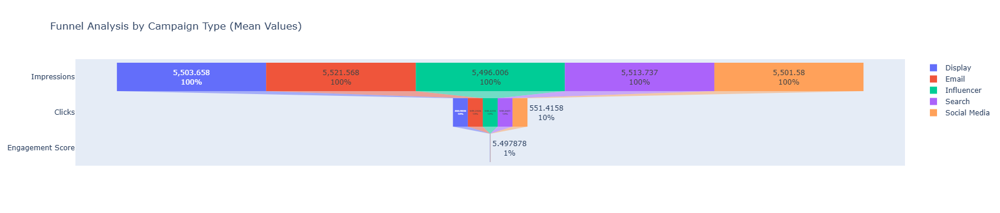

In [64]:
grouped = data.groupby('Campaign_Type', observed=True).agg({
    'Impressions': 'mean',
    'Clicks': 'mean',
    'Engagement_Score': 'mean'
}).reset_index()

fig = go.Figure()

for i, row in grouped.iterrows():
    fig.add_trace(go.Funnel(
        name=row['Campaign_Type'],
        y=['Impressions', 'Clicks', 'Engagement Score'],
        x=[row['Impressions'], row['Clicks'], row['Engagement_Score']],
        textinfo="value+percent previous"
    ))

fig.update_layout(
    title='Funnel Analysis by Campaign Type (Mean Values)',
    funnelmode='stack'  
)

fig.show()


## Note
* **Here, we can analyze customer conversion ratios to evaluate the effectiveness of our campaign and identify which channel generates the most profit.**

In [65]:
grouped

,Campaign_Type,Impressions,Clicks,Engagement_Score
0,Display,5503.657589,550.953535,5.505889
1,Email,5521.568272,549.232556,5.499624
2,Influencer,5496.006398,548.623491,5.483134
3,Search,5513.737057,548.650148,5.487138
4,Social Media,5501.579752,551.415827,5.497878


#### Acquisition_Cost vs Conversion_Rate Relation 

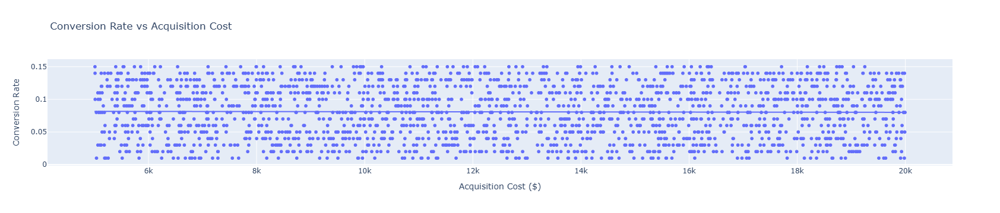

In [72]:
data_sample = data.sample(n=2000, random_state=42)

fig = px.scatter(

    data_sample,
    x='Acquisition_Cost',
    y='Conversion_Rate',
    title='Conversion Rate vs Acquisition Cost',
    labels={'Acquisition_Cost': 'Acquisition Cost ($)', 'Conversion_Rate': 'Conversion Rate'},
    trendline='ols'
)

for trace in fig.data:
    if 'trendline' in trace.name:
        trace.line.color = 'red'
fig.show()

* **Here it has horizontal trendline it shows ideal distribution of data. here we can find various relation using trendline such as ...**
* Negative correlation: As acquisition cost increases, conversion rate decreases → inefficient spend. -- downword trendline
                    
* Positive correlation: Higher spend leads to higher conversions → possibly justified.                -- upword trendline
               
* No pattern: No clear relationship → may need segmentation or further analysis.   current line      

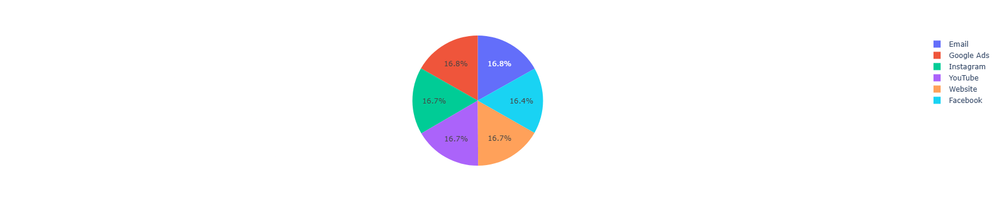

In [73]:
fig = px.pie(data, values='Acquisition_Cost', names='Channel_Used')

fig.update_layout(width = 600)
fig.show()

* **Target is to find maximum and minimum aquisition cost by channel used for marketing campaign.**

In [74]:
data['Date'].dtype

dtype('<M8[ns]')

In [75]:
data['Date'] = pd.to_datetime(data['Date']) 

data['Date'].dtype # it should 'ns'

dtype('<M8[ns]')

In [76]:
data['Weekday'] = data['Date'].dt.day_name()
data['Month'] = data['Date'].dt.month_name()

In [77]:
months = data.groupby('Month', observed=True)['Impressions'].mean().reset_index()
months = months.sort_values(by='Impressions', ascending=False)
data['Weekday'] = data['Date'].dt.day_name()

months

,Month,Impressions
6,June,5542.547324
7,March,5521.808806
1,August,5521.616612
9,November,5519.140998
0,April,5515.653771
11,September,5514.495255
2,December,5510.672737
3,February,5506.637774
8,May,5497.113727
10,October,5489.993466


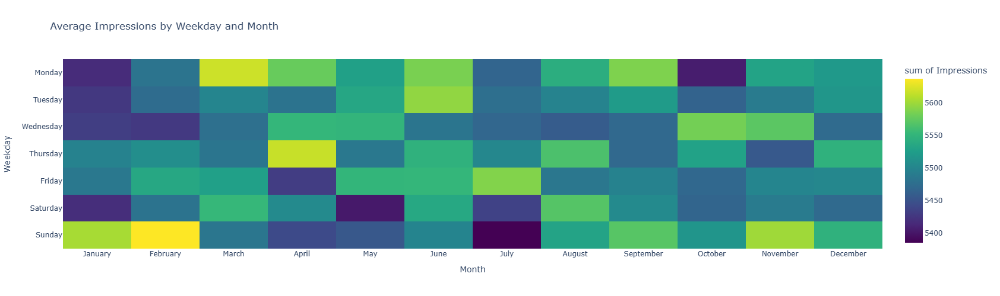

In [78]:

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

heatmap_data = data.pivot_table(
    index='Weekday',
    columns='Month',
    values='Impressions',
    aggfunc='mean'  
).reset_index()

heatmap_data = heatmap_data.melt(id_vars='Weekday', var_name='Month', value_name='Impressions')

fig = px.density_heatmap(
    heatmap_data,
    x='Month',
    y='Weekday',
    z='Impressions',
    color_continuous_scale='Viridis',
    category_orders={
        'Month': month_order,
        'Weekday': weekday_order
    },
    title='Average Impressions by Weekday and Month'
)

fig.update_layout(
    height=500,
    width=1000,
    xaxis_title='Month',
    yaxis_title='Weekday'
)

fig.show()

* **Since Impressions do not exhibit any clear pattern, we will not proceed with pattern analysis for Engagement Score and Clicks.**

* The Impressions appear to be relatively consistent across all months, which is expected given that this is a representative (synthetic) dataset.
*  However, for real-world datasets, plotting this type of heatmap could help reveal meaningful patterns     
    — for example, if Sundays consistently receive higher impressions, the Sunday cells would appear more yellowish in the heatmap.



# Innovate Industries

In [79]:
Innovate_Industries = data[data['Company'] == 'Innovate Industries']
Innovate_Industries.shape

(39709, 18)

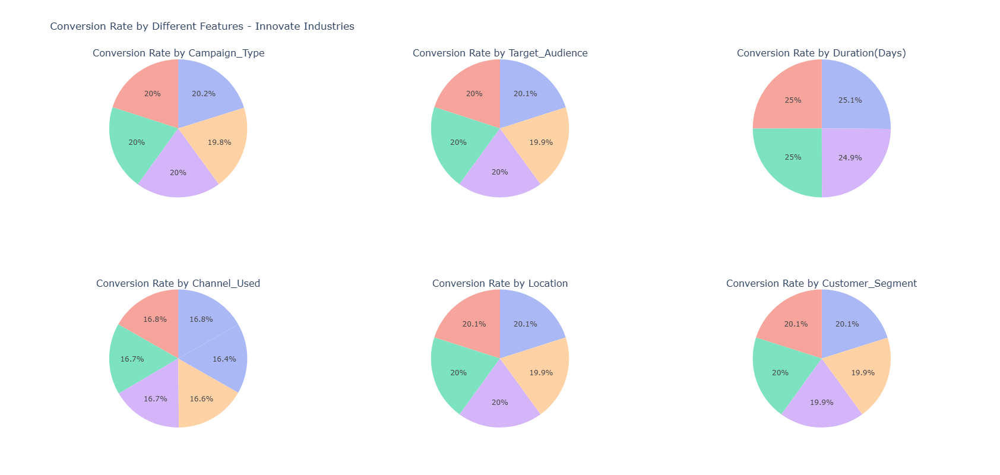

In [80]:
cols = ['Campaign_Type', 'Target_Audience', 'Duration(Days)', 'Channel_Used', 'Location', 'Customer_Segment']

custom_colors = ['#AAB8F5', '#F7A59C', '#7DE2BF', '#D4B5F9', '#FFD2A6']

fig = make_subplots(
    rows=2,
    cols=3,
    specs=[[{'type': 'domain'}]*3]*2,
    subplot_titles=[f'Conversion Rate by {col}' for col in cols]
)

row = 1
col = 1

for i, column in enumerate(cols):

    grouped_tenure = Innovate_Industries.groupby(column, observed=True)['Conversion_Rate'].mean().reset_index()
    grouped_tenure = grouped_tenure.sort_values(by='Conversion_Rate', ascending=False)

    num_labels = len(grouped_tenure)
    color_set = custom_colors[:num_labels] if num_labels <= 5 else (custom_colors * ((num_labels // 5) + 1))[:num_labels]

    fig.add_trace(
        go.Pie(
            labels=grouped_tenure[column],
            values=grouped_tenure['Conversion_Rate'],
            name=column,
            marker=dict(colors=color_set)
        ),
        row=row,
        col=col
    )
    col += 1
    if col > 3:
        col = 1
        row += 1

fig.update_layout(
    height=800,
    width=1400,
    title_text="Conversion Rate by Different Features - Innovate Industries",
    showlegend=False 
)
fig.show()

### 📊 Using Conversion Rates to Guide Marketing Strategy

* Analyze conversion rates by category or audience segment
  Identify where your campaigns are most and least effective.

* Focus on high-converting segments
Maintain performance by reinforcing successful strategies and scaling efforts.

* Improve low-converting segments
Adjust marketing tactics, offer targeted discounts, or personalize content to boost engagement.

* Make data-driven decisions
Use insights to allocate budget wisely and refine future campaigns.

* Continuously test and optimize
Treat performance data as a guide for ongoing strategy improvement.

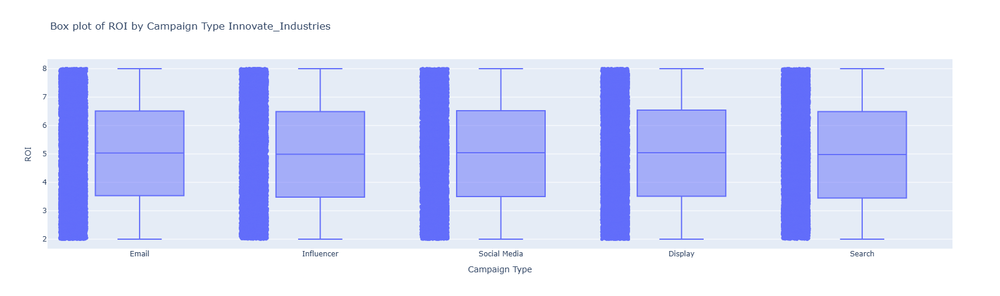

In [81]:
fig = px.box(Innovate_Industries, x='Campaign_Type', y='ROI',
             title='Box plot of ROI by Campaign Type Innovate_Industries',
             labels={'Campaign_Type': 'Campaign Type', 'ROI': 'ROI'}, points='all')

fig.update_layout(
    xaxis_title='Campaign Type',
    yaxis_title='ROI',
    width=800,
    height=500
)
fig.show()

## 📉 Using Outliers to Refine Marketing Performance

* **Identify outliers in conversion rates or acquisition costs**    
Detect unusual results that may indicate either exceptional success or campaign inefficiency. 
                        
* **Evaluate high outliers**                     
Assess whether they represent extraordinary performance or data anomalies.  
If valid, analyze what worked and replicate it where possible.              

* **Respond to low outliers**                   
Consider reducing acquisition costs or testing alternative marketing strategies.             
Look into issues like poor targeting, messaging mismatch, or channel ineffectiveness.             

* **Use outliers as signals, not noise**               
Outliers can reveal valuable insights — treat them as opportunities to learn and adapt.    

# NexGen Systems

In [82]:
NexGen_Systems = data[data['Company'] == 'NexGen Systems']
NexGen_Systems

,Campaign_ID,Company,Campaign_Type,Target_Audience,Duration(Days),Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Date,Weekday,Month
1,2,NexGen Systems,Email,Women 35-44,60,Google Ads,0.12,11566.0,5.61,New York,German,116,7523,7,Fashionistas,2021-01-02,Saturday,January
4,5,NexGen Systems,Email,Men 25-34,15,YouTube,0.05,16452.0,6.50,Los Angeles,Mandarin,379,4201,3,Health & Wellness,2021-01-05,Tuesday,January
6,7,NexGen Systems,Email,Women 35-44,60,Website,0.13,11067.0,2.86,Los Angeles,Spanish,817,8749,10,Tech Enthusiasts,2021-01-07,Thursday,January
10,11,NexGen Systems,Display,Men 25-34,45,Email,0.12,8590.0,3.49,New York,Spanish,321,6628,10,Tech Enthusiasts,2021-01-11,Monday,January
22,23,NexGen Systems,Social Media,Women 35-44,15,YouTube,0.13,8699.0,2.12,Miami,French,646,3841,5,Health & Wellness,2021-01-23,Saturday,January
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199965,199966,NexGen Systems,Social Media,All Ages,15,YouTube,0.08,18098.0,3.09,Chicago,German,247,2978,4,Foodies,2021-11-07,Sunday,November
199967,199968,NexGen Systems,Influencer,Women 35-44,45,Website,0.05,18261.0,6.60,Houston,Mandarin,398,5009,2,Foodies,2021-11-09,Tuesday,November
199969,199970,NexGen Systems,Social Media,All Ages,60,Instagram,0.14,14899.0,7.08,New York,Spanish,753,9673,4,Outdoor Adventurers,2021-11-11,Thursday,November
199981,199982,NexGen Systems,Social Media,All Ages,30,Website,0.08,6396.0,4.54,Los Angeles,German,576,5294,8,Outdoor Adventurers,2021-11-23,Tuesday,November


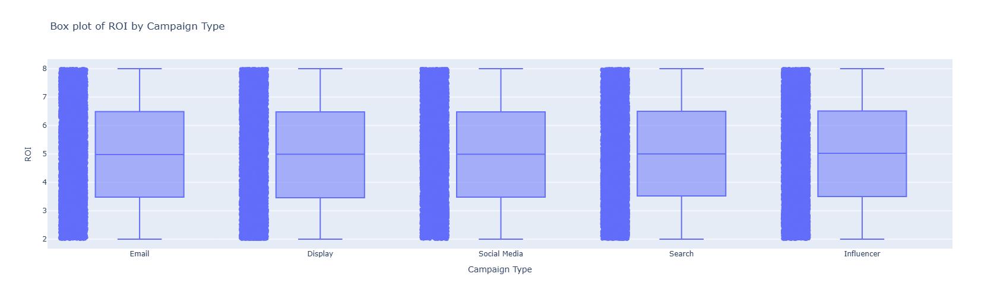

In [83]:
fig = px.box(NexGen_Systems, x='Campaign_Type', y='ROI',
             title='Box plot of ROI by Campaign Type',
             labels={'Campaign_Type': 'Campaign Type', 'ROI': 'ROI'}, points='all')

fig.update_layout(
    xaxis_title='Campaign Type',
    yaxis_title='ROI',
    width=800,
    height=500
)
fig.show()

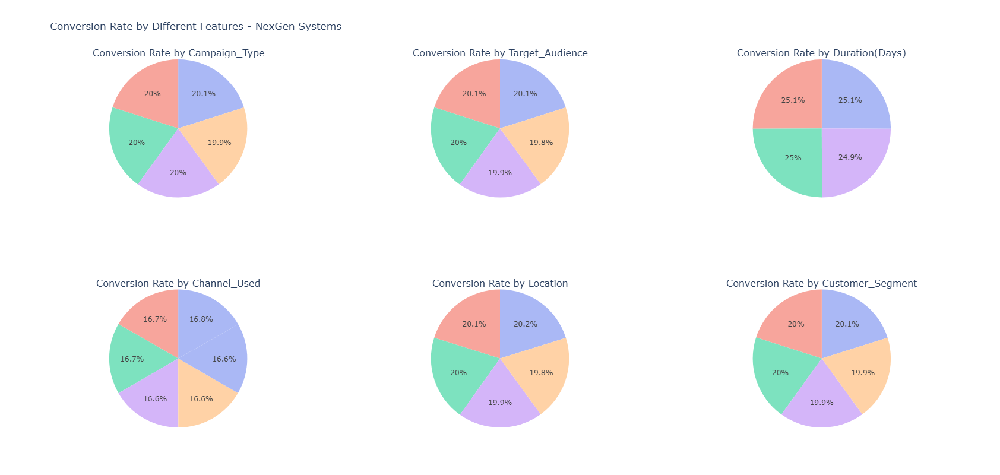

In [84]:
cols = ['Campaign_Type', 'Target_Audience', 'Duration(Days)', 'Channel_Used', 'Location', 'Customer_Segment']

custom_colors = ['#AAB8F5', '#F7A59C', '#7DE2BF', '#D4B5F9', '#FFD2A6']

fig = make_subplots(
    rows=2,
    cols=3,
    specs=[[{'type': 'domain'}]*3]*2,
    subplot_titles=[f'Conversion Rate by {col}' for col in cols]
)

row = 1
col = 1

for i, column in enumerate(cols):

    grouped_tenure = NexGen_Systems.groupby(column, observed=True)['Conversion_Rate'].mean().reset_index()
    grouped_tenure = grouped_tenure.sort_values(by='Conversion_Rate', ascending=False)

    num_labels = len(grouped_tenure)
    color_set = custom_colors[:num_labels] if num_labels <= 5 else (custom_colors * ((num_labels // 5) + 1))[:num_labels]

    fig.add_trace(
        go.Pie(
            labels=grouped_tenure[column],
            values=grouped_tenure['Conversion_Rate'],
            name=column,
            marker=dict(colors=color_set)
        ),
        row=row,
        col=col
    )
    col += 1
    if col > 3:
        col = 1
        row += 1

fig.update_layout(
    height=800,
    width=1400,
    title_text="Conversion Rate by Different Features - NexGen Systems",
    showlegend=False 
)
fig.show()



# <div  style="text-align: left; background-color:#f1e9d2; font-family: Trebuchet MS; padding: 13px;  color: #333; line-height:0.9; margin-bottom: 0em; text-align: center; font-size: 20px">📌 &nbsp; **Note:** This dataset is synthetic and has been created to simulate real-world marketing data for educational and analytical purposes.</div>